# Handwriting Recognition
From image to characeters

In [1]:
import json
import multiprocessing
import os
import random
import string
import time

import cv2
import matplotlib.pyplot as plt
from mxboard import SummaryWriter
import mxnet as mx
from mxnet import nd, autograd, gluon
from mxnet.gluon.model_zoo.vision import resnet34_v1
import numpy as np
from skimage import transform as skimage_tf
from skimage import exposure
from tqdm import tqdm
np.seterr(all='raise')
plt.rcParams['figure.figsize'] = [5, 5]
mx.random.seed(1)

from ocr.utils.iam_dataset import IAMDataset, resize_image
from ocr.utils.draw_text_on_image import draw_text_on_image

alphabet_encoding = r' $!"#&\'()~^<>[]|_{}=@%*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz'
alphabet_dict = {alphabet_encoding[i]:i for i in range(len(alphabet_encoding))}


## Network definition
Define a CNN-biLSTM for handwriting recognition.
Image features at two levels were obtained from a truncated Resnet34 and downsampled with a simple CNN. 
The 2 sets of image features were fed into two separate biLSTM for handwriting recognition. 

In [2]:
class EncoderLayer(gluon.HybridBlock):
    '''
    The encoder layer takes the image features from a CNN. The image features are transposed so that the LSTM 
    slices of the image features can be sequentially fed into the LSTM from left to right (and back via the
    bidirectional LSTM). 
    '''
    def __init__(self, hidden_states=200, rnn_layers=1, max_seq_len=100, **kwargs):
        self.max_seq_len = max_seq_len
        super(EncoderLayer, self).__init__(**kwargs)
        with self.name_scope():
            self.lstm = mx.gluon.rnn.LSTM(hidden_states, rnn_layers, bidirectional=True)
            
    def hybrid_forward(self, F, x):
        x = x.transpose((0, 3, 1, 2))
        x = x.flatten()
        x = x.split(num_outputs=self.max_seq_len, axis=1) # (SEQ_LEN, N, CHANNELS)
        x = F.concat(*[elem.expand_dims(axis=0) for elem in x], dim=0)
        x = self.lstm(x)
        x = x.transpose((1, 0, 2)) #(N, SEQ_LEN, HIDDEN_UNITS)
        return x

class CNNBiLSTM(gluon.HybridBlock):
    '''
    The CNN-biLSTM to recognise handwriting text given an image of handwriten text.
    Parameters
    ----------
    num_downsamples: int, default 2
        The number of times to downsample the image features. Each time the features are downsampled, a new LSTM
        is created. 
    resnet_layer_id: int, default 4
        The layer ID to obtain features from the resnet34
    lstm_hidden_states: int, default 200
        The number of hidden states used in the LSTMs
    lstm_layers: int, default 1
        The number of layers of LSTMs to use
    '''
    FEATURE_EXTRACTOR_FILTER = 64
    def __init__(self, num_downsamples=2, resnet_layer_id=4, rnn_hidden_states=200, rnn_layers=1, max_seq_len=100, ctx=mx.gpu(0), **kwargs):
        super(CNNBiLSTM, self).__init__(**kwargs)
        self.p_dropout = 0.5
        self.num_downsamples = num_downsamples
        self.max_seq_len = max_seq_len
        self.ctx = ctx
        with self.name_scope():
            self.body = self.get_body(resnet_layer_id=resnet_layer_id)

            self.encoders = gluon.nn.HybridSequential()
            with self.encoders.name_scope():
                for i in range(self.num_downsamples):
                    encoder = self.get_encoder(rnn_hidden_states=rnn_hidden_states, rnn_layers=rnn_layers, max_seq_len=max_seq_len)
                    self.encoders.add(encoder)
            self.decoder = self.get_decoder()
            self.downsampler = self.get_down_sampler(self.FEATURE_EXTRACTOR_FILTER)

    def get_down_sampler(self, num_filters):
        '''
        Creates a two-stacked Conv-BatchNorm-Relu and then a pooling layer to
        downsample the image features by half.
        
        Parameters
        ----------
        num_filters: int
            To select the number of filters in used the downsampling convolutional layer.
        Returns
        -------
        network: gluon.nn.HybridSequential
            The downsampler network that decreases the width and height of the image features by half.
        
        '''
        out = gluon.nn.HybridSequential()
        with out.name_scope():
            for _ in range(2):
                out.add(gluon.nn.Conv2D(num_filters, 3, strides=1, padding=1))
                out.add(gluon.nn.BatchNorm(in_channels=num_filters))
                out.add(gluon.nn.Activation('relu'))
            out.add(gluon.nn.MaxPool2D(2))
            out.collect_params().initialize(mx.init.Normal(), ctx=self.ctx)
        out.hybridize()
        return out

    def get_body(self, resnet_layer_id):
        '''
        Create the feature extraction network based on resnet34.
        The first layer of the res-net is converted into grayscale by averaging the weights of the 3 channels
        of the original resnet.
        
        Parameters
        ----------
        resnet_layer_id: int
            The resnet_layer_id specifies which layer to take from 
            the bottom of the network.
        Returns
        -------
        network: gluon.nn.HybridSequential
            The body network for feature extraction based on resnet
        '''
        
        pretrained = resnet34_v1(pretrained=True, ctx=self.ctx)
        pretrained_2 = resnet34_v1(pretrained=True, ctx=mx.cpu(0))
        first_weights = pretrained_2.features[0].weight.data().mean(axis=1).expand_dims(axis=1)
        # First weights could be replaced with individual channels.
        
        body = gluon.nn.HybridSequential()
        with body.name_scope():
            first_layer = gluon.nn.Conv2D(channels=64, kernel_size=(7, 7), padding=(3, 3), strides=(2, 2), in_channels=1, use_bias=False)
            first_layer.initialize(mx.init.Xavier(), ctx=self.ctx)
            first_layer.weight.set_data(first_weights)
            body.add(first_layer)
            body.add(*pretrained.features[1:-resnet_layer_id])
        return body

    def get_encoder(self, rnn_hidden_states, rnn_layers, max_seq_len):
        '''
        Creates an LSTM to learn the sequential component of the image features.
        
        Parameters
        ----------
        
        rnn_hidden_states: int
            The number of hidden states in the RNN
        
        rnn_layers: int
            The number of layers to stack the RNN
        Returns
        -------
        
        network: gluon.nn.Sequential
            The encoder network to learn the sequential information of the image features
        '''

        encoder = gluon.nn.HybridSequential()
        with encoder.name_scope():
            encoder.add(EncoderLayer(hidden_states=rnn_hidden_states, rnn_layers=rnn_layers, max_seq_len=max_seq_len))
            encoder.add(gluon.nn.Dropout(self.p_dropout))
        encoder.collect_params().initialize(mx.init.Xavier(), ctx=self.ctx)
        return encoder
    
    def get_decoder(self):
        '''
        Creates a network to convert the output of the encoder into characters.
        '''

        alphabet_size = len(alphabet_encoding) + 1
        decoder = mx.gluon.nn.Dense(units=alphabet_size, flatten=False)
        decoder.collect_params().initialize(mx.init.Xavier(), ctx=self.ctx)
        return decoder

    def hybrid_forward(self, F, x):
        features = self.body(x)
        hidden_states = []
        hs = self.encoders[0](features)
        hidden_states.append(hs)
        for i, _ in enumerate(range(self.num_downsamples - 1)):
            features = self.downsampler(features)
            hs = self.encoders[i+1](features)
            hidden_states.append(hs)
        hs = F.concat(*hidden_states, dim=2)
        output = self.decoder(hs)
        return output

### Helper functions to train the network 

In [3]:
def transform(image, label):
    '''
    This function resizes the input image and converts so that it could be fed into the network.
    Furthermore, the label (text) is one-hot encoded.
    '''
    image = np.expand_dims(image, axis=0).astype(np.float32)
    
    if image[0, 0, 0] > 1:
        image = image/255.
    
    #image = (image - 0.942532484060557) / 0.15926149044640417
    label_encoded = np.zeros(max_seq_len, dtype=np.float32)-1
    i = 0
    for word in label:
        word = word.replace("&quot", r'"')
        word = word.replace("&amp", r'&')
        word = word.replace('";', '\"')
        for letter in word:
            label_encoded[i] = alphabet_dict[letter]
            i += 1
    return image, label_encoded

def augment_transform(image, label):
    '''
    This function randomly:
        - translates the input image by +-width_range and +-height_range (percentage).
        - scales the image by y_scaling and x_scaling (percentage)
        - shears the image by shearing_factor (radians)
    '''
    
    ty = random.uniform(-random_y_translation, random_y_translation)
    tx = random.uniform(-random_x_translation, random_x_translation)

    sx = random.uniform(1. - random_y_scaling, 1. + random_y_scaling)
    sy = random.uniform(1. - random_x_scaling, 1. + random_x_scaling)

    s = random.uniform(-random_shearing, random_shearing)
    
    gamma = random.uniform(0.001, 2)
    image = exposure.adjust_gamma(image, gamma)
    st = skimage_tf.AffineTransform(scale=(sx, sy),
                                    shear=s,
                                    translation=(tx*image.shape[1], ty*image.shape[0]))
    augmented_image = skimage_tf.warp(image, st, cval=1.0)
    
    return transform(augmented_image*255., label)


def decode(prediction):
    '''
    Returns the string given one-hot encoded vectors.
    '''

    results = []
    for word in prediction:
        result = []
        for i, index in enumerate(word):
            if i < len(word) - 1 and word[i] == word[i+1] and word[-1] != -1: #Hack to decode label as well
                continue
            if index == len(alphabet_dict) or index == -1:
                continue
            else:
                result.append(alphabet_encoding[int(index)])
        results.append(result)
    words = [''.join(word) for word in results]
    return words


In [4]:
def run_epoch(e, network, dataloader, trainer, log_dir, print_name, is_train):
    total_loss = nd.zeros(1, ctx)
    #print("Ctx is ",ctx)
    for i, (x, y) in enumerate(dataloader):
        x = x.as_in_context(ctx)
        y = y.as_in_context(ctx)
        #print("This")

        with autograd.record(train_mode=is_train):
            output = network(x)
            loss_ctc = ctc_loss(output, y)
        #print("this 2")

        if is_train:
            loss_ctc.backward()
            trainer.step(x.shape[0])
        #print("This 3")

        if i == 0 and e % send_image_every_n == 0 and e > 0:
            predictions = output.softmax().topk(axis=2).asnumpy()
            decoded_text = decode(predictions)
            output_image = draw_text_on_image(x.asnumpy(), decoded_text)
            output_image[output_image < 0] = 0
            output_image[output_image > 1] = 1
            print("{} first decoded text = {}".format(print_name, decoded_text[0]))
            with SummaryWriter(logdir=log_dir, verbose=False, flush_secs=5) as sw:
                sw.add_image('bb_{}_image'.format(print_name), output_image, global_step=e)

        total_loss += loss_ctc.mean()

    epoch_loss = float(total_loss.asscalar())/len(dataloader)

    with SummaryWriter(logdir=log_dir, verbose=False, flush_secs=5) as sw:
        sw.add_scalar('loss', {print_name: epoch_loss}, global_step=e)

    return epoch_loss


In [5]:
ctx = mx.gpu() if mx.context.num_gpus() > 0 else mx.cpu()
#print("ctx is ", ctx)

epochs = 120
learning_rate = 0.001
batch_size = 32

max_seq_len = 50
print_every_n = 5
send_image_every_n = 5

num_downsamples = 2
resnet_layer_id = 4
lstm_hidden_states = 512
lstm_layers = 2

random_y_translation, random_x_translation = 0.03, 0.03
random_y_scaling, random_x_scaling = 0.1, 0.1
random_shearing = 0.7

log_dir = "./logs/handwriting_recognition"
checkpoint_dir = "model_checkpoint"
checkpoint_name = "handwriting.params"


## Data

In [6]:
class ReceiptDataset(gluon.data.Dataset):
    
    def __init__(self, path_to_data='results_test/', split='train'):
        f = open(path_to_data+'sample.txt', 'r')
        self.data = []
        lines = f.readlines()
        if split == 'train':
            lines = lines[:int(0.8*len(lines))]
        elif split == 'test':
            lines  = lines[int(0.8*len(lines)):]
        else:
            raise "Wrong split, must be train or test"
            
        for l in lines:
            splits = l[:-1].split(' ')
            filename = path_to_data+splits[0]
            text = ' '.join(splits[1:])
            self.data.append((filename, text))
            
    def __getitem__(self, idx):
        filename, text = self.data[idx]
        image =  cv2.imread(filename, 0)
        return resize_image(np.expand_dims(image, axis=2), (60,200))[0], text
        
    def __len__(self):
        return  len(self.data)
    

In [7]:
train_ds = ReceiptDataset(split='train')
test_ds = ReceiptDataset(split='test')


In [8]:
print("Number of training samples: {}".format(len(train_ds)))
print("Number of testing samples: {}".format(len(test_ds)))
train_data = gluon.data.DataLoader(train_ds.transform(transform), batch_size, shuffle=True, last_batch="rollover", num_workers=4)
test_data = gluon.data.DataLoader(test_ds.transform(transform), batch_size, shuffle=True, last_batch="keep", num_workers=4)


Number of training samples: 24800
Number of testing samples: 6200
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

Process ForkPoolWorker-7:
Process ForkPoolWorker-8:
Process ForkPoolWorker-6:
Process ForkPoolWorker-3:
Process ForkPoolWorker-4:
Process ForkPoolWorker-5:
Process ForkPoolWorker-1:
Process ForkPoolWorker-2:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/skundala/miniconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/skundala/miniconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/skundala/miniconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/skundala/miniconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/skundala/miniconda3/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/Users/skundala/miniconda3/lib/python3.7/multiprocessing/pool.py", line 110, in worker
 

(32, 500, 1)


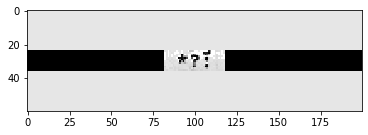

In [9]:
plt.imshow(test_ds.transform(transform)[2][0].squeeze(), cmap='gray')


### Training

In [10]:
net = CNNBiLSTM(num_downsamples=num_downsamples, resnet_layer_id=resnet_layer_id , rnn_hidden_states=lstm_hidden_states, rnn_layers=lstm_layers, max_seq_len=max_seq_len, ctx=ctx)
net.hybridize()

In [11]:
ctc_loss = gluon.loss.CTCLoss(weight=0.2)
best_test_loss = 10e5


In [12]:
if False and (os.path.isfile(os.path.join(checkpoint_dir, checkpoint_name))):
    net.load_parameters(os.path.join(checkpoint_dir, checkpoint_name))
    print("Parameters loaded")
    print(run_epoch(0, net, test_data, None, log_dir, print_name="pretrained", is_train=False))
    

In [13]:
pretrained = "models/handwriting_line8.params"
if False and (os.path.isfile(pretrained)):
    net.load_parameters(pretrained, ctx=ctx)
    print("Parameters loaded")
    print(run_epoch(0, net, test_data, None, log_dir, print_name="pretrained", is_train=False))
    

In [14]:
trainer = gluon.Trainer(net.collect_params(), 'adam', {'learning_rate': 0.0001})


In [ ]:
for e in range(epochs):
    #print("Running this train_loss")
    train_loss = run_epoch(e, net, train_data, trainer, log_dir, print_name="train", is_train=True)
    #print("Running this test_loss")
    test_loss = run_epoch(e, net, test_data, trainer, log_dir, print_name="test", is_train=False)    
    if test_loss < best_test_loss:
        print("Saving network, previous best test loss {:.6f}, current test loss {:.6f}".format(best_test_loss, test_loss))
        net.save_parameters(os.path.join(checkpoint_dir, checkpoint_name))
        best_test_loss = test_loss
        
    if e % print_every_n == 0 and e > 0:
        print("Epoch {0}, train_loss {1:.6f}, test_loss {2:.6f}".format(e, train_loss, test_loss))

Saving network, previous best test loss 1000000.000000, current test loss 2.102580
Saving network, previous best test loss 2.102580, current test loss 1.006359
Saving network, previous best test loss 1.006359, current test loss 0.607299
Saving network, previous best test loss 0.607299, current test loss 0.491300
Saving network, previous best test loss 0.491300, current test loss 0.431361
train first decoded text = EB</
test first decoded text = 0.0%
Saving network, previous best test loss 0.431361, current test loss 0.324207
Epoch 5, train_loss 3.238647, test_loss 0.324207
Saving network, previous best test loss 0.324207, current test loss 0.323873
Saving network, previous best test loss 0.323873, current test loss 0.312745
Saving network, previous best test loss 0.312745, current test loss 0.281291
Saving network, previous best test loss 0.281291, current test loss 0.228605
train first decoded text = f'
test first decoded text = 59.47$
Epoch 10, train_loss 2.907420, test_loss 0.238362

# Results
Visually inspect the results of the test dataset

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)


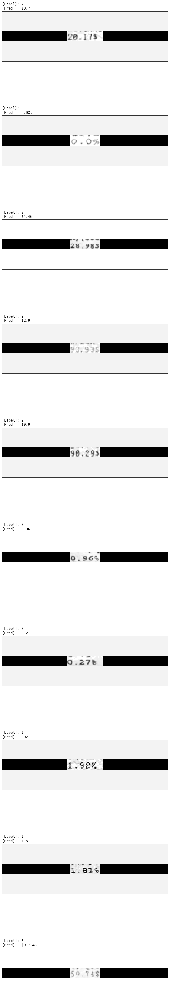

In [30]:
figs_to_plot = 10
fig, axs = plt.subplots(figs_to_plot, figsize=(10, 6.3*figs_to_plot))

for i in range(figs_to_plot):
    n = int(random.random()*len(test_ds))
    image, actual_label = test_ds[n]
    image, _ = transform(image, actual_label)

    image = nd.array(image)
    image = image.as_in_context(ctx)
    image = image.expand_dims(axis=0)
    output = net(image)
    predictions = output.softmax().topk(axis=2).asnumpy()
    decoded_prediction_text = decode(predictions)[0].replace("&quot", '\"').replace("&amp", "&").replace('";', '\"')
    axs[i].imshow(image.asnumpy().squeeze(), cmap='Greys_r')
    axs[i].set_title("[Label]: {}\n[Pred]:  {}".format(actual_label[0].replace("&quot", '\"').replace("&amp", "&").replace('";', '\"'), decoded_prediction_text),
                    fontdict={"horizontalalignment":"left", "family":"monospace"}, x=0)
    axs[i].tick_params(axis='both',       
                       which='both',      
                       bottom=False,      
                       top=False,         
                       left=False,
                       right=False,
                       labelleft=False,
                       labelbottom=False) 


## Writing the transformed test dataset for validating the language denoiser

In [17]:
ds_lm = test_ds.transform(transform)


In [18]:
outputs = []
for image, actual_label in tqdm(ds_lm):
    image = nd.array(image)
    image = image.as_in_context(ctx)
    image = image.expand_dims(axis=0)
    output = net(image)
    predictions = output.softmax().topk(axis=2).asnumpy()
    decoded_prediction_text = decode(predictions)[0]
    outputs.append([decode([actual_label])[0].replace("&quot;", '"').replace("&amp;", "&"), decoded_prediction_text.replace("&quot", '\"').replace("&amp", "&").replace('";', '\"')])

  0%|          | 0/200 [00:00<?, ?it/s]

(32, 500, 1)


  0%|          | 1/200 [00:00<01:07,  2.96it/s]

(32, 500, 1)


  1%|          | 2/200 [00:00<01:04,  3.09it/s]

(32, 500, 1)


  2%|▏         | 3/200 [00:00<01:01,  3.18it/s]

(32, 500, 1)


  2%|▏         | 4/200 [00:01<01:00,  3.24it/s]

(32, 500, 1)


  2%|▎         | 5/200 [00:01<00:59,  3.29it/s]

(32, 500, 1)


  3%|▎         | 6/200 [00:02<01:10,  2.77it/s]

(32, 500, 1)


  4%|▎         | 7/200 [00:02<01:14,  2.60it/s]

(32, 500, 1)


  4%|▍         | 8/200 [00:02<01:08,  2.80it/s]

(32, 500, 1)


  4%|▍         | 9/200 [00:03<01:04,  2.97it/s]

(32, 500, 1)


  5%|▌         | 10/200 [00:03<01:07,  2.84it/s]

(32, 500, 1)


  6%|▌         | 11/200 [00:03<01:07,  2.79it/s]

(32, 500, 1)


  6%|▌         | 12/200 [00:04<01:06,  2.84it/s]

(32, 500, 1)


  6%|▋         | 13/200 [00:04<01:03,  2.97it/s]

(32, 500, 1)


  7%|▋         | 14/200 [00:04<01:01,  3.03it/s]

(32, 500, 1)


  8%|▊         | 15/200 [00:05<00:58,  3.15it/s]

(32, 500, 1)


  8%|▊         | 16/200 [00:05<01:01,  2.99it/s]

(32, 500, 1)


  8%|▊         | 17/200 [00:05<01:02,  2.92it/s]

(32, 500, 1)


  9%|▉         | 18/200 [00:06<01:00,  3.01it/s]

(32, 500, 1)


 10%|▉         | 19/200 [00:06<00:57,  3.12it/s]

(32, 500, 1)


 10%|█         | 20/200 [00:06<00:57,  3.14it/s]

(32, 500, 1)


 10%|█         | 21/200 [00:06<00:55,  3.25it/s]

(32, 500, 1)


 11%|█         | 22/200 [00:07<00:53,  3.31it/s]

(32, 500, 1)


 12%|█▏        | 23/200 [00:07<00:56,  3.12it/s]

(32, 500, 1)


 12%|█▏        | 24/200 [00:07<00:58,  3.00it/s]

(32, 500, 1)


 12%|█▎        | 25/200 [00:08<00:58,  2.99it/s]

(32, 500, 1)


 13%|█▎        | 26/200 [00:08<00:55,  3.12it/s]

(32, 500, 1)


 14%|█▎        | 27/200 [00:08<00:54,  3.17it/s]

(32, 500, 1)


 14%|█▍        | 28/200 [00:09<00:53,  3.23it/s]

(32, 500, 1)


 14%|█▍        | 29/200 [00:09<00:52,  3.28it/s]

(32, 500, 1)


 15%|█▌        | 30/200 [00:09<00:51,  3.31it/s]

(32, 500, 1)


 16%|█▌        | 31/200 [00:10<00:50,  3.36it/s]

(32, 500, 1)


 16%|█▌        | 32/200 [00:10<00:50,  3.30it/s]

(32, 500, 1)


 16%|█▋        | 33/200 [00:10<00:49,  3.35it/s]

(32, 500, 1)


 17%|█▋        | 34/200 [00:10<00:48,  3.39it/s]

(32, 500, 1)


 18%|█▊        | 35/200 [00:11<00:48,  3.42it/s]

(32, 500, 1)


 18%|█▊        | 36/200 [00:11<00:53,  3.06it/s]

(32, 500, 1)


 18%|█▊        | 37/200 [00:12<00:55,  2.96it/s]

(32, 500, 1)


 19%|█▉        | 38/200 [00:12<00:54,  2.99it/s]

(32, 500, 1)


 20%|█▉        | 39/200 [00:12<00:53,  2.98it/s]

(32, 500, 1)


 20%|██        | 40/200 [00:12<00:51,  3.10it/s]

(32, 500, 1)


 20%|██        | 41/200 [00:13<00:50,  3.16it/s]

(32, 500, 1)


 21%|██        | 42/200 [00:13<00:49,  3.19it/s]

(32, 500, 1)


 22%|██▏       | 43/200 [00:13<00:48,  3.21it/s]

(32, 500, 1)


 22%|██▏       | 44/200 [00:14<00:48,  3.23it/s]

(32, 500, 1)


 22%|██▎       | 45/200 [00:14<00:47,  3.25it/s]

(32, 500, 1)


 23%|██▎       | 46/200 [00:14<00:46,  3.29it/s]

(32, 500, 1)


 24%|██▎       | 47/200 [00:15<00:46,  3.31it/s]

(32, 500, 1)


 24%|██▍       | 48/200 [00:15<00:46,  3.29it/s]

(32, 500, 1)


 24%|██▍       | 49/200 [00:15<00:45,  3.33it/s]

(32, 500, 1)


 25%|██▌       | 50/200 [00:15<00:44,  3.37it/s]

(32, 500, 1)


 26%|██▌       | 51/200 [00:16<00:43,  3.39it/s]

(32, 500, 1)


 26%|██▌       | 52/200 [00:16<00:43,  3.41it/s]

(32, 500, 1)


 26%|██▋       | 53/200 [00:16<00:43,  3.39it/s]

(32, 500, 1)


 27%|██▋       | 54/200 [00:17<00:42,  3.43it/s]

(32, 500, 1)


 28%|██▊       | 55/200 [00:17<00:42,  3.40it/s]

(32, 500, 1)


 28%|██▊       | 56/200 [00:17<00:42,  3.40it/s]

(32, 500, 1)


 28%|██▊       | 57/200 [00:18<00:42,  3.36it/s]

(32, 500, 1)


 29%|██▉       | 58/200 [00:18<00:42,  3.35it/s]

(32, 500, 1)


 30%|██▉       | 59/200 [00:18<00:41,  3.37it/s]

(32, 500, 1)


 30%|███       | 60/200 [00:18<00:41,  3.40it/s]

(32, 500, 1)


 30%|███       | 61/200 [00:19<00:40,  3.41it/s]

(32, 500, 1)


 31%|███       | 62/200 [00:19<00:40,  3.42it/s]

(32, 500, 1)


 32%|███▏      | 63/200 [00:19<00:40,  3.41it/s]

(32, 500, 1)


 32%|███▏      | 64/200 [00:20<00:40,  3.40it/s]

(32, 500, 1)


 32%|███▎      | 65/200 [00:20<00:39,  3.43it/s]

(32, 500, 1)


 33%|███▎      | 66/200 [00:20<00:39,  3.43it/s]

(32, 500, 1)


 34%|███▎      | 67/200 [00:20<00:38,  3.44it/s]

(32, 500, 1)


 34%|███▍      | 68/200 [00:21<00:39,  3.37it/s]

(32, 500, 1)


 34%|███▍      | 69/200 [00:21<00:38,  3.40it/s]

(32, 500, 1)


 35%|███▌      | 70/200 [00:21<00:38,  3.34it/s]

(32, 500, 1)


 36%|███▌      | 71/200 [00:22<00:38,  3.37it/s]

(32, 500, 1)


 36%|███▌      | 72/200 [00:22<00:37,  3.40it/s]

(32, 500, 1)


 36%|███▋      | 73/200 [00:22<00:37,  3.41it/s]

(32, 500, 1)


 37%|███▋      | 74/200 [00:23<00:37,  3.36it/s]

(32, 500, 1)


 38%|███▊      | 75/200 [00:23<00:36,  3.41it/s]

(32, 500, 1)


 38%|███▊      | 76/200 [00:23<00:36,  3.43it/s]

(32, 500, 1)


 38%|███▊      | 77/200 [00:23<00:36,  3.42it/s]

(32, 500, 1)


 39%|███▉      | 78/200 [00:24<00:35,  3.43it/s]

(32, 500, 1)


 40%|███▉      | 79/200 [00:24<00:35,  3.44it/s]

(32, 500, 1)


 40%|████      | 80/200 [00:24<00:34,  3.44it/s]

(32, 500, 1)


 40%|████      | 81/200 [00:25<00:34,  3.44it/s]

(32, 500, 1)


 41%|████      | 82/200 [00:25<00:34,  3.44it/s]

(32, 500, 1)


 42%|████▏     | 83/200 [00:25<00:33,  3.45it/s]

(32, 500, 1)


 42%|████▏     | 84/200 [00:25<00:33,  3.45it/s]

(32, 500, 1)


 42%|████▎     | 85/200 [00:26<00:33,  3.43it/s]

(32, 500, 1)


 43%|████▎     | 86/200 [00:26<00:33,  3.44it/s]

(32, 500, 1)


 44%|████▎     | 87/200 [00:26<00:33,  3.42it/s]

(32, 500, 1)


 44%|████▍     | 88/200 [00:27<00:32,  3.42it/s]

(32, 500, 1)


 44%|████▍     | 89/200 [00:27<00:32,  3.43it/s]

(32, 500, 1)


 45%|████▌     | 90/200 [00:27<00:32,  3.41it/s]

(32, 500, 1)


 46%|████▌     | 91/200 [00:27<00:31,  3.44it/s]

(32, 500, 1)


 46%|████▌     | 92/200 [00:28<00:31,  3.41it/s]

(32, 500, 1)


 46%|████▋     | 93/200 [00:28<00:31,  3.41it/s]

(32, 500, 1)


 47%|████▋     | 94/200 [00:28<00:30,  3.42it/s]

(32, 500, 1)


 48%|████▊     | 95/200 [00:29<00:30,  3.44it/s]

(32, 500, 1)


 48%|████▊     | 96/200 [00:29<00:30,  3.41it/s]

(32, 500, 1)


 48%|████▊     | 97/200 [00:29<00:30,  3.42it/s]

(32, 500, 1)


 49%|████▉     | 98/200 [00:30<00:29,  3.42it/s]

(32, 500, 1)


 50%|████▉     | 99/200 [00:30<00:29,  3.44it/s]

(32, 500, 1)


 50%|█████     | 100/200 [00:30<00:29,  3.42it/s]

(32, 500, 1)


 50%|█████     | 101/200 [00:30<00:29,  3.38it/s]

(32, 500, 1)


 51%|█████     | 102/200 [00:31<00:29,  3.33it/s]

(32, 500, 1)


 52%|█████▏    | 103/200 [00:31<00:28,  3.37it/s]

(32, 500, 1)


 52%|█████▏    | 104/200 [00:31<00:28,  3.37it/s]

(32, 500, 1)


 52%|█████▎    | 105/200 [00:32<00:28,  3.36it/s]

(32, 500, 1)


 53%|█████▎    | 106/200 [00:32<00:27,  3.39it/s]

(32, 500, 1)


 54%|█████▎    | 107/200 [00:32<00:27,  3.41it/s]

(32, 500, 1)


 54%|█████▍    | 108/200 [00:32<00:26,  3.43it/s]

(32, 500, 1)


 55%|█████▍    | 109/200 [00:33<00:26,  3.43it/s]

(32, 500, 1)


 55%|█████▌    | 110/200 [00:33<00:26,  3.35it/s]

(32, 500, 1)


 56%|█████▌    | 111/200 [00:33<00:26,  3.40it/s]

(32, 500, 1)


 56%|█████▌    | 112/200 [00:34<00:25,  3.41it/s]

(32, 500, 1)


 56%|█████▋    | 113/200 [00:34<00:25,  3.43it/s]

(32, 500, 1)


 57%|█████▋    | 114/200 [00:34<00:25,  3.42it/s]

(32, 500, 1)


 57%|█████▊    | 115/200 [00:35<00:25,  3.39it/s]

(32, 500, 1)


 58%|█████▊    | 116/200 [00:35<00:24,  3.43it/s]

(32, 500, 1)


 58%|█████▊    | 117/200 [00:35<00:24,  3.42it/s]

(32, 500, 1)


 59%|█████▉    | 118/200 [00:35<00:23,  3.44it/s]

(32, 500, 1)


 60%|█████▉    | 119/200 [00:36<00:23,  3.43it/s]

(32, 500, 1)


 60%|██████    | 120/200 [00:36<00:23,  3.44it/s]

(32, 500, 1)


 60%|██████    | 121/200 [00:36<00:23,  3.41it/s]

(32, 500, 1)


 61%|██████    | 122/200 [00:37<00:22,  3.41it/s]

(32, 500, 1)


 62%|██████▏   | 123/200 [00:37<00:22,  3.42it/s]

(32, 500, 1)


 62%|██████▏   | 124/200 [00:37<00:22,  3.43it/s]

(32, 500, 1)


 62%|██████▎   | 125/200 [00:37<00:21,  3.42it/s]

(32, 500, 1)


 63%|██████▎   | 126/200 [00:38<00:21,  3.42it/s]

(32, 500, 1)


 64%|██████▎   | 127/200 [00:38<00:21,  3.43it/s]

(32, 500, 1)


 64%|██████▍   | 128/200 [00:38<00:21,  3.42it/s]

(32, 500, 1)


 64%|██████▍   | 129/200 [00:39<00:20,  3.43it/s]

(32, 500, 1)


 65%|██████▌   | 130/200 [00:39<00:20,  3.42it/s]

(32, 500, 1)


 66%|██████▌   | 131/200 [00:39<00:20,  3.44it/s]

(32, 500, 1)


 66%|██████▌   | 132/200 [00:40<00:19,  3.44it/s]

(32, 500, 1)


 66%|██████▋   | 133/200 [00:40<00:19,  3.44it/s]

(32, 500, 1)


 67%|██████▋   | 134/200 [00:40<00:19,  3.44it/s]

(32, 500, 1)


 68%|██████▊   | 135/200 [00:40<00:19,  3.42it/s]

(32, 500, 1)


 68%|██████▊   | 136/200 [00:41<00:18,  3.42it/s]

(32, 500, 1)


 68%|██████▊   | 137/200 [00:41<00:18,  3.42it/s]

(32, 500, 1)


 69%|██████▉   | 138/200 [00:41<00:18,  3.43it/s]

(32, 500, 1)


 70%|██████▉   | 139/200 [00:42<00:17,  3.42it/s]

(32, 500, 1)


 70%|███████   | 140/200 [00:42<00:17,  3.43it/s]

(32, 500, 1)


 70%|███████   | 141/200 [00:42<00:17,  3.43it/s]

(32, 500, 1)


 71%|███████   | 142/200 [00:42<00:16,  3.42it/s]

(32, 500, 1)


 72%|███████▏  | 143/200 [00:43<00:16,  3.44it/s]

(32, 500, 1)


 72%|███████▏  | 144/200 [00:43<00:16,  3.43it/s]

(32, 500, 1)


 72%|███████▎  | 145/200 [00:43<00:16,  3.43it/s]

(32, 500, 1)


 73%|███████▎  | 146/200 [00:44<00:15,  3.40it/s]

(32, 500, 1)


 74%|███████▎  | 147/200 [00:44<00:15,  3.37it/s]

(32, 500, 1)


 74%|███████▍  | 148/200 [00:44<00:15,  3.39it/s]

(32, 500, 1)


 74%|███████▍  | 149/200 [00:44<00:14,  3.42it/s]

(32, 500, 1)


 75%|███████▌  | 150/200 [00:45<00:14,  3.40it/s]

(32, 500, 1)


 76%|███████▌  | 151/200 [00:45<00:14,  3.39it/s]

(32, 500, 1)


 76%|███████▌  | 152/200 [00:45<00:14,  3.38it/s]

(32, 500, 1)


 76%|███████▋  | 153/200 [00:46<00:13,  3.41it/s]

(32, 500, 1)


 77%|███████▋  | 154/200 [00:46<00:13,  3.43it/s]

(32, 500, 1)


 78%|███████▊  | 155/200 [00:46<00:13,  3.41it/s]

(32, 500, 1)


 78%|███████▊  | 156/200 [00:47<00:12,  3.44it/s]

(32, 500, 1)


 78%|███████▊  | 157/200 [00:47<00:12,  3.35it/s]

(32, 500, 1)


 79%|███████▉  | 158/200 [00:47<00:12,  3.38it/s]

(32, 500, 1)


 80%|███████▉  | 159/200 [00:47<00:12,  3.37it/s]

(32, 500, 1)


 80%|████████  | 160/200 [00:48<00:11,  3.38it/s]

(32, 500, 1)


 80%|████████  | 161/200 [00:48<00:11,  3.39it/s]

(32, 500, 1)


 81%|████████  | 162/200 [00:48<00:11,  3.41it/s]

(32, 500, 1)


 82%|████████▏ | 163/200 [00:49<00:10,  3.40it/s]

(32, 500, 1)


 82%|████████▏ | 164/200 [00:49<00:10,  3.41it/s]

(32, 500, 1)


 82%|████████▎ | 165/200 [00:49<00:10,  3.43it/s]

(32, 500, 1)


 83%|████████▎ | 166/200 [00:49<00:09,  3.44it/s]

(32, 500, 1)


 84%|████████▎ | 167/200 [00:50<00:09,  3.46it/s]

(32, 500, 1)


 84%|████████▍ | 168/200 [00:50<00:09,  3.43it/s]

(32, 500, 1)


 84%|████████▍ | 169/200 [00:50<00:09,  3.42it/s]

(32, 500, 1)


 85%|████████▌ | 170/200 [00:51<00:08,  3.43it/s]

(32, 500, 1)


 86%|████████▌ | 171/200 [00:51<00:08,  3.43it/s]

(32, 500, 1)


 86%|████████▌ | 172/200 [00:51<00:08,  3.42it/s]

(32, 500, 1)


 86%|████████▋ | 173/200 [00:52<00:07,  3.43it/s]

(32, 500, 1)


 87%|████████▋ | 174/200 [00:52<00:07,  3.43it/s]

(32, 500, 1)


 88%|████████▊ | 175/200 [00:52<00:07,  3.43it/s]

(32, 500, 1)


 88%|████████▊ | 176/200 [00:52<00:06,  3.44it/s]

(32, 500, 1)


 88%|████████▊ | 177/200 [00:53<00:06,  3.44it/s]

(32, 500, 1)


 89%|████████▉ | 178/200 [00:53<00:06,  3.43it/s]

(32, 500, 1)


 90%|████████▉ | 179/200 [00:53<00:06,  3.42it/s]

(32, 500, 1)


 90%|█████████ | 180/200 [00:54<00:05,  3.40it/s]

(32, 500, 1)


 90%|█████████ | 181/200 [00:54<00:05,  3.41it/s]

(32, 500, 1)


 91%|█████████ | 182/200 [00:54<00:05,  3.43it/s]

(32, 500, 1)


 92%|█████████▏| 183/200 [00:54<00:04,  3.43it/s]

(32, 500, 1)


 92%|█████████▏| 184/200 [00:55<00:04,  3.42it/s]

(32, 500, 1)


 92%|█████████▎| 185/200 [00:55<00:04,  3.45it/s]

(32, 500, 1)


 93%|█████████▎| 186/200 [00:55<00:04,  3.43it/s]

(32, 500, 1)


 94%|█████████▎| 187/200 [00:56<00:03,  3.44it/s]

(32, 500, 1)


 94%|█████████▍| 188/200 [00:56<00:03,  3.41it/s]

(32, 500, 1)


 94%|█████████▍| 189/200 [00:56<00:03,  3.43it/s]

(32, 500, 1)


 95%|█████████▌| 190/200 [00:56<00:02,  3.43it/s]

(32, 500, 1)


 96%|█████████▌| 191/200 [00:57<00:02,  3.44it/s]

(32, 500, 1)


 96%|█████████▌| 192/200 [00:57<00:02,  3.45it/s]

(32, 500, 1)


 96%|█████████▋| 193/200 [00:57<00:02,  3.46it/s]

(32, 500, 1)


 97%|█████████▋| 194/200 [00:58<00:01,  3.45it/s]

(32, 500, 1)


 98%|█████████▊| 195/200 [00:58<00:01,  3.45it/s]

(32, 500, 1)


 98%|█████████▊| 196/200 [00:58<00:01,  3.45it/s]

(32, 500, 1)


 98%|█████████▊| 197/200 [00:59<00:00,  3.45it/s]

(32, 500, 1)


 99%|█████████▉| 198/200 [00:59<00:00,  3.45it/s]

(32, 500, 1)


100%|█████████▉| 199/200 [00:59<00:00,  3.43it/s]

(32, 500, 1)


100%|██████████| 200/200 [00:59<00:00,  3.46it/s]


In [19]:
json.dump(outputs, open('dataset/typo/validating.json', 'w'))

In [20]:
ds_lm = train_ds
with open('dataset/typo/text_train.txt', 'w') as f:
    for _, actual_label in ds_lm:
        f.write(str(actual_label[0].replace("&quot;", '"').replace("&amp;", "&"))+"\n")

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)

(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)
(32, 500, 1)


## Manual Test

In [29]:
image = cv2.imread("images/output_13_0.png", 0)

image, _ = resize_image(image, (60, 800))
image, _ = transform(image, "")
image = nd.array(image)
image = image.as_in_context(ctx)
image = image.expand_dims(axis=0)
output = net(image)
predictions = output.softmax().topk(axis=2).asnumpy()
decoded_prediction_text = decode(predictions)[0].replace("&quot", '\"').replace("&amp", "&").replace('";', '\"')
plt.figure(figsize=(20,20))
plt.imshow(image.asnumpy().squeeze(), cmap='Greys_r')
plt.title("[Pred]:  {}".format(decoded_prediction_text), fontdict={"horizontalalignment":"left", "family":"monospace"}, x=0)

(131, 372)


MXNetError: [12:56:20] /Users/travis/build/dmlc/mxnet-distro/mxnet-build/3rdparty/tvm/nnvm/include/nnvm/graph.h:230: Check failed: it != attrs.end() Cannot find attribute shape in the graph

Stack trace returned 10 entries:
[bt] (0) 0   libmxnet.so                         0x000000011f8f8c90 std::__1::__tree<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, std::__1::__map_value_compare<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, std::__1::less<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> > >, true>, std::__1::allocator<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*> > >::destroy(std::__1::__tree_node<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, void*>*) + 2736
[bt] (1) 1   libmxnet.so                         0x000000011f8f8a3f std::__1::__tree<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, std::__1::__map_value_compare<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, std::__1::less<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> > >, true>, std::__1::allocator<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*> > >::destroy(std::__1::__tree_node<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, void*>*) + 2143
[bt] (2) 2   libmxnet.so                         0x000000011f8f8669 std::__1::__tree<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, std::__1::__map_value_compare<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, std::__1::less<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> > >, true>, std::__1::allocator<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*> > >::destroy(std::__1::__tree_node<std::__1::__value_type<std::__1::basic_string<char, std::__1::char_traits<char>, std::__1::allocator<char> >, mxnet::NDArrayFunctionReg*>, void*>*) + 1161
[bt] (3) 3   libmxnet.so                         0x0000000120ef6da2 MXSymbolInferShape + 11458
[bt] (4) 4   libmxnet.so                         0x0000000120f6fbf2 mxnet::imperative::AllocateMemory(nnvm::Graph const&, nnvm::IndexedGraph const&, mxnet::Context const&, unsigned int, unsigned int, std::__1::vector<mxnet::imperative::MemoryPlanInfo, std::__1::allocator<mxnet::imperative::MemoryPlanInfo> > const&, std::__1::vector<mxnet::NDArray*, std::__1::allocator<mxnet::NDArray*> > const&, std::__1::vector<mxnet::OpReqType, std::__1::allocator<mxnet::OpReqType> >*, std::__1::multimap<unsigned long, mxnet::NDArray, std::__1::less<unsigned long>, std::__1::allocator<std::__1::pair<unsigned long const, mxnet::NDArray> > >&&) + 194
[bt] (5) 5   libmxnet.so                         0x0000000120f75a6f mxnet::CachedOp::DynamicForward(mxnet::Context const&, std::__1::vector<mxnet::NDArray*, std::__1::allocator<mxnet::NDArray*> > const&, std::__1::vector<mxnet::NDArray*, std::__1::allocator<mxnet::NDArray*> > const&) + 2335
[bt] (6) 6   libmxnet.so                         0x0000000120f769f7 mxnet::CachedOp::Forward(std::__1::shared_ptr<mxnet::CachedOp> const&, std::__1::vector<mxnet::NDArray*, std::__1::allocator<mxnet::NDArray*> > const&, std::__1::vector<mxnet::NDArray*, std::__1::allocator<mxnet::NDArray*> > const&) + 1031
[bt] (7) 7   libmxnet.so                         0x0000000120edf78c MXInvokeCachedOp + 972
[bt] (8) 8   libmxnet.so                         0x0000000120edfc5b MXInvokeCachedOpEx + 139
[bt] (9) 9   libffi.6.dylib                      0x000000010de8c884 ffi_call_unix64 + 76

